<a href="https://colab.research.google.com/github/melaksenay/interpolation/blob/main/diffusion_to_interpolation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from base64 import b64encode

import numpy
import torch
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from huggingface_hub import notebook_login

# For video display:
from IPython.display import HTML
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from torch import autocast
from torchvision import transforms as tfms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer, logging
import os

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device: os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

In [13]:
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(torch_device)
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")
scheduler = LMSDiscreteScheduler(beta_start = 0.00085, beta_end = 0.012, beta_schedule = "scaled_linear", num_train_timesteps = 1000)

vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

#Autoencoder

In [3]:
from IPython.display import display

In [4]:
def pil_to_latent(input_image):
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_image).unsqueeze(0).to(torch_device) * 2 - 1) # scaling from -1 to 1
        latent = latent.latent_dist.sample() #pick a value from the latent distribution
    return latent * .18215 # just a magic number that the stable diffusion people thought was good for the UNet
def latent_to_pil(latent):
    latent = latent / .18215 # undo the magic number
    images = []
    with torch.no_grad():
      for i in range (latent.shape[0]):
        image = vae.decode(latent[i].unsqueeze(0)).sample
        image = (image/2 + 0.5).clamp(0,1)
        image = tfms.ToPILImage()(image.squeeze(0).cpu())
        images.append(image)
    return images

In [5]:
!curl --output macaw.jpg 'https://lafeber.com/pet-birds/wp-content/uploads/2018/06/Scarlet-Macaw-2.jpg'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 58602  100 58602    0     0   285k      0 --:--:-- --:--:-- --:--:--  286k


In [6]:
input_image = Image.open('macaw.jpg').resize((512,512))

In [7]:
encoded = pil_to_latent(input_image)
print(encoded.shape)

torch.Size([1, 4, 64, 64])


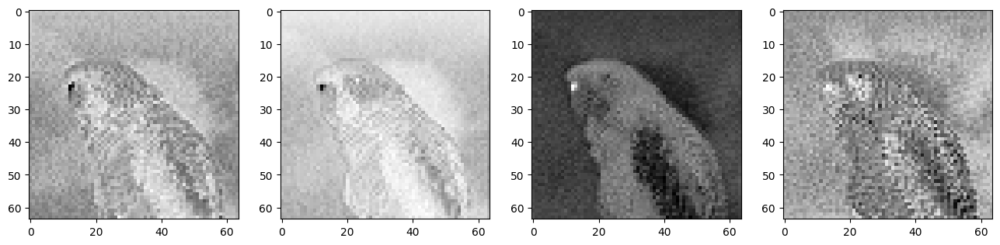

In [8]:
fig, axis = plt.subplots(1,4,figsize=(16,4))
for c in range(encoded.shape[1]):
    axis[c].imshow(encoded[0,c].cpu().numpy(), cmap='Greys')

In [9]:
decoded = latent_to_pil(encoded)


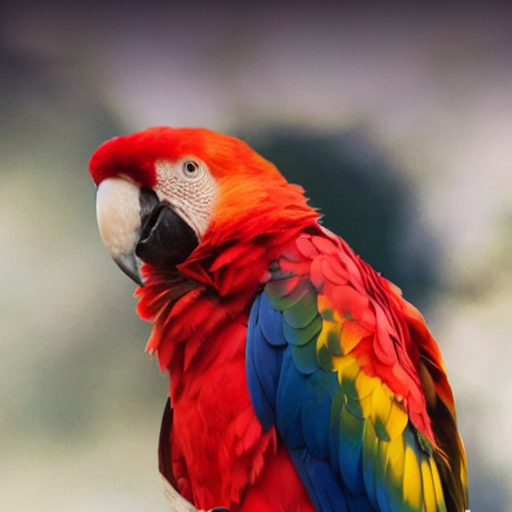

In [10]:
display(decoded[0])

#Scheduler
During training we want to add noise to an image and then predict the noise in that image. We don't want the noise to only be high or low, so we sample from a distribution.

In [11]:
scheduler.set_timesteps(15)
print(scheduler.timesteps)
print(scheduler.sigmas)

tensor([999.0000, 927.6429, 856.2857, 784.9286, 713.5714, 642.2143, 570.8571,
        499.5000, 428.1429, 356.7857, 285.4286, 214.0714, 142.7143,  71.3571,
          0.0000])
tensor([14.6146,  9.6826,  6.6780,  4.7746,  3.5221,  2.6666,  2.0606,  1.6156,
         1.2768,  1.0097,  0.7913,  0.6056,  0.4397,  0.2780,  0.0292,  0.0000])


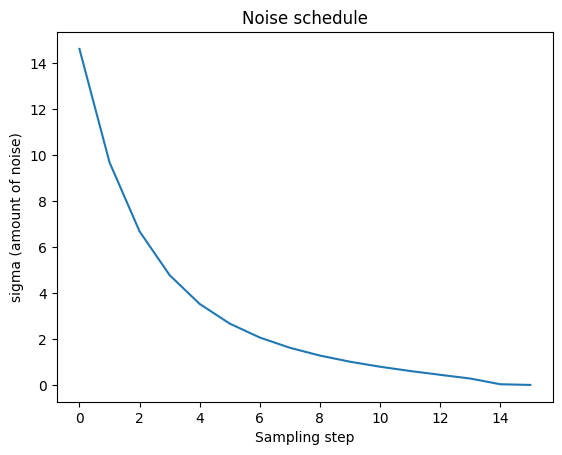

In [12]:
plt.plot(scheduler.sigmas)
plt.title("Noise schedule")
plt.xlabel("Sampling step")
plt.ylabel("sigma (amount of noise)")
plt.show()


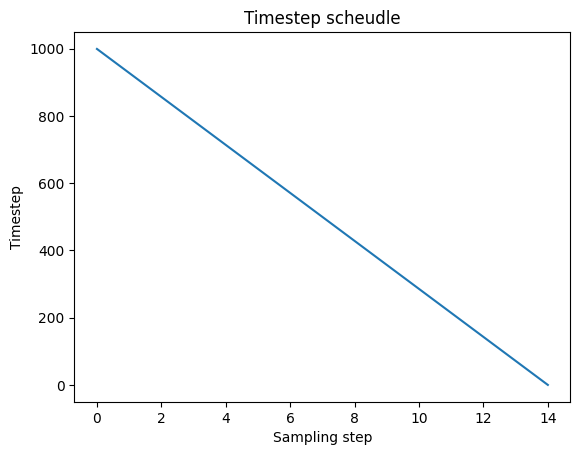

In [13]:
plt.plot(scheduler.timesteps)
plt.title("Timestep scheudle")
plt.xlabel("Sampling step")
plt.ylabel("Timestep")
plt.show()

let's visualize what the image looks like at different sampling step (sigma levels)

In [14]:
noise = torch.randn_like(encoded)

In [15]:
noise.shape

torch.Size([1, 4, 64, 64])

In [16]:
sampling_step = 10
torch.tensor([scheduler.timesteps[sampling_step]])

tensor([285.4286])

In [17]:
# essence comes from the docs: noisy = original + (noise * sigma).
noisy_images = []
encoded_noise = scheduler.add_noise(encoded, noise, torch.tensor([scheduler.timesteps[sampling_step]]))
encoded_noise2 = scheduler.add_noise(encoded, noise, torch.tensor([scheduler.timesteps[12]]))
noisy_images.append(encoded_noise)
noisy_images.append(encoded_noise2)


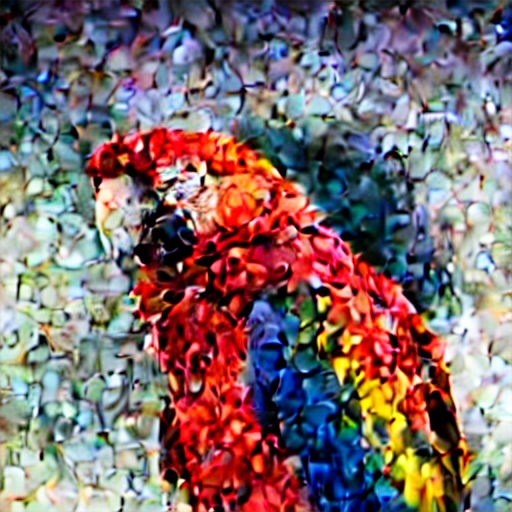

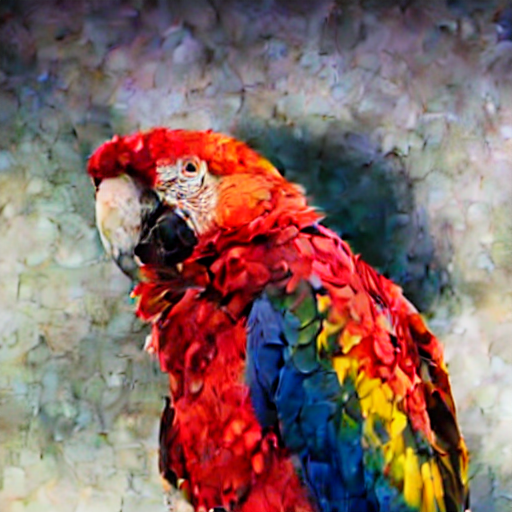

In [18]:
for image in noisy_images:
  display(latent_to_pil(image)[0])

#Going from Text to an embedding

In [19]:
prompt = 'A picture of a cat'

In [20]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation = True, return_tensors= "pt")
text_input['input_ids'][0]

tensor([49406,   320,  1674,   539,   320,  2368, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407])

In [21]:
for t in text_input['input_ids'][0][:9]:
  print(t, tokenizer.decoder.get(int(t)))

tensor(49406) <|startoftext|>
tensor(320) a</w>
tensor(1674) picture</w>
tensor(539) of</w>
tensor(320) a</w>
tensor(2368) cat</w>
tensor(49407) <|endoftext|>
tensor(49407) <|endoftext|>
tensor(49407) <|endoftext|>


In [22]:
print(tokenizer.decoder.get(2368))

cat</w>


In [23]:
output_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

In [24]:
output_embeddings.shape

torch.Size([1, 77, 768])

In [25]:
output_embeddings

tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.6034, -0.5322,  0.0629,  ..., -0.3964,  0.0877, -0.9558],
         [-0.5936, -0.5407,  0.0731,  ..., -0.3876,  0.0906, -0.9436],
         [-0.6393, -0.4703,  0.1103,  ..., -0.3904,  0.1351, -0.9726]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [26]:
text_encoder.text_model.embeddings

CLIPTextEmbeddings(
  (token_embedding): Embedding(49408, 768)
  (position_embedding): Embedding(77, 768)
)

In [27]:
token_embedding_layer = text_encoder.text_model.embeddings.token_embedding #vocab size 49408, embedding dimension 768
token_embedding_layer

Embedding(49408, 768)

In [28]:
embedding = token_embedding_layer(torch.tensor(2368, device = torch_device))
embedding.shape #the token for cat now is mapped to 768 dim vector.

torch.Size([768])

In [29]:
token_embeddings = token_embedding_layer(text_input.input_ids.to(torch_device))
print(token_embeddings.shape) # 1 batch, 77 tokens (max length), 768 token embeddings per token.
token_embeddings

torch.Size([1, 77, 768])


tensor([[[ 0.0011,  0.0032,  0.0003,  ..., -0.0018,  0.0003,  0.0019],
         [ 0.0013, -0.0011, -0.0126,  ..., -0.0124,  0.0120,  0.0080],
         [ 0.0235, -0.0118,  0.0110,  ...,  0.0049,  0.0078,  0.0160],
         ...,
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052],
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052],
         [ 0.0012,  0.0077, -0.0011,  ..., -0.0015,  0.0009,  0.0052]]],
       device='cuda:0', grad_fn=<EmbeddingBackward0>)

In [30]:
?text_encoder

In [31]:
pos_emb_layer = text_encoder.text_model.embeddings.position_embedding
pos_emb_layer # 77 possible positions, 768 embedding size for a single token.

Embedding(77, 768)

In [32]:
position_ids = text_encoder.text_model.embeddings.position_ids[:,:77]
#takes each of the 77 possible position ids and finds an embedding for it.
position_embeddings = pos_emb_layer(position_ids)
print(position_embeddings.shape)
position_embeddings

torch.Size([1, 77, 768])


tensor([[[ 0.0016,  0.0020,  0.0002,  ..., -0.0013,  0.0008,  0.0015],
         [ 0.0042,  0.0029,  0.0002,  ...,  0.0010,  0.0015, -0.0012],
         [ 0.0018,  0.0007, -0.0012,  ..., -0.0029, -0.0009,  0.0026],
         ...,
         [ 0.0216,  0.0055, -0.0101,  ..., -0.0065, -0.0029,  0.0037],
         [ 0.0188,  0.0073, -0.0077,  ..., -0.0025, -0.0009,  0.0057],
         [ 0.0330,  0.0281,  0.0289,  ...,  0.0160,  0.0102, -0.0310]]],
       device='cuda:0', grad_fn=<EmbeddingBackward0>)

In [33]:
#combine position and token embeddings
input_embeddings = position_embeddings + token_embeddings
print(input_embeddings.shape)
input_embeddings

torch.Size([1, 77, 768])


tensor([[[ 2.6770e-03,  5.2133e-03,  4.9323e-04,  ..., -3.1321e-03,
           1.0659e-03,  3.4316e-03],
         [ 5.5371e-03,  1.7510e-03, -1.2381e-02,  ..., -1.1410e-02,
           1.3508e-02,  6.8378e-03],
         [ 2.5356e-02, -1.1019e-02,  9.7663e-03,  ...,  1.9460e-03,
           6.8375e-03,  1.8573e-02],
         ...,
         [ 2.2781e-02,  1.3262e-02, -1.1241e-02,  ..., -8.0054e-03,
          -2.0560e-03,  8.9366e-03],
         [ 2.0026e-02,  1.5015e-02, -8.7638e-03,  ..., -4.0313e-03,
           1.8487e-05,  1.0885e-02],
         [ 3.4206e-02,  3.5826e-02,  2.7768e-02,  ...,  1.4465e-02,
           1.1110e-02, -2.5745e-02]]], device='cuda:0', grad_fn=<AddBackward0>)

Let's check that this is the same as calling text_encoder.text_model.embeddings

In [34]:
text_encoder.text_model.embeddings(text_input.input_ids.to(torch_device)) == input_embeddings

tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]]], device='cuda:0')

In [35]:
??text_encoder.text_model.forward

In [36]:
??text_encoder.text_model._build_causal_attention_mask

Object `text_encoder.text_model._build_causal_attention_mask` not found.


In [37]:
import torch
import torch.nn as nn

def get_output_embeds(input_embeddings):
  batch_size, seq_len = input_embeddings.shape[:2]
  # Use standard PyTorch function to build causal attention mask
  causal_attention_mask = nn.Transformer.generate_square_subsequent_mask(seq_len, dtype=input_embeddings.dtype)
  causal_attention_mask = causal_attention_mask.to(torch_device) # Move mask to the correct device

  encoder_outputs = text_encoder.text_model.encoder(
            inputs_embeds=input_embeddings,
            attention_mask=None, # We are providing causal_attention_mask instead
            causal_attention_mask=causal_attention_mask,
            output_attentions=None,
            output_hidden_states=True, #want output embdeddings not final output.
            #return_dict = None,
        )
  output = encoder_outputs[0] #only want hidden state

  output = text_encoder.text_model.final_layer_norm(output)

  return output

In [38]:
out_embs_test = get_output_embeds(input_embeddings)
print(out_embs_test.shape)
out_embs_test

torch.Size([1, 77, 768])


tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.6034, -0.5322,  0.0629,  ..., -0.3964,  0.0877, -0.9558],
         [-0.5936, -0.5407,  0.0731,  ..., -0.3876,  0.0906, -0.9436],
         [-0.6393, -0.4703,  0.1103,  ..., -0.3904,  0.1351, -0.9726]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [39]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_embedding_layer(input_ids)

# The new embedding. In this case just the input embedding of token 2368...
replacement_token_embedding = text_encoder.get_input_embeddings()(torch.tensor(2368, device=torch_device))

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

print(modified_output_embeddings.shape)
modified_output_embeddings

torch.Size([1, 77, 768])


tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.6942,  0.3538,  1.0991,  ..., -1.5716, -1.2643, -0.0121],
         ...,
         [-0.6034, -0.5322,  0.0629,  ..., -0.3964,  0.0877, -0.9558],
         [-0.5936, -0.5407,  0.0731,  ..., -0.3876,  0.0906, -0.9436],
         [-0.6393, -0.4703,  0.1103,  ..., -0.3904,  0.1351, -0.9726]]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>)

In [40]:
def generate_with_embs(text_embeddings):
  height = 512
  width = 512
  num_inference_steps = 30
  generator = torch.manual_seed(32)
  guidance_scale = 7.5
  batch_size = 1

  max_length = text_input.input_ids.shape[-1] #77
  uncond_input = tokenizer([""]*batch_size, padding = "max_length", max_length= max_length, return_tensors = "pt")
  with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
  text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

  #scheduler:
  scheduler.set_timesteps(num_inference_steps) # Correctly set timesteps

  #latents
  latents = torch.randn(
      (batch_size, unet.config.in_channels, height//8, width//8),
      generator = generator,
  )
  latents = latents.to(torch_device)
  latents = latents * scheduler.init_noise_sigma

  #loop
  for i, t in tqdm(enumerate(scheduler.timesteps), total = len(scheduler.timesteps)):
    latent_model_input = torch.cat([latents]* 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input,t)

    with torch.no_grad():
      noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    latents = scheduler.step(noise_pred, t, latents).prev_sample

  return display(latent_to_pil(latents)[0])

  0%|          | 0/30 [00:00<?, ?it/s]

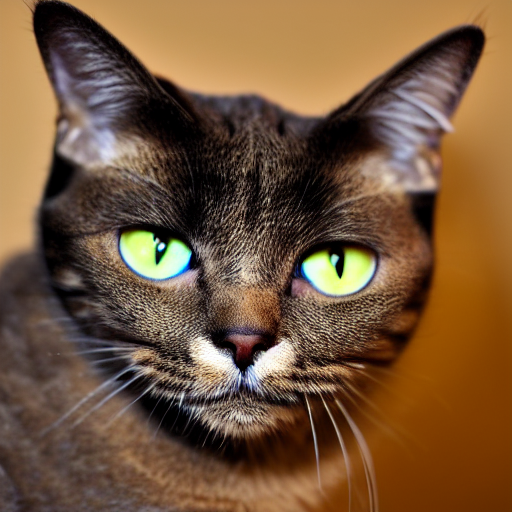

In [41]:
generate_with_embs(modified_output_embeddings)

In [42]:
prompt = 'skunk'
print(tokenizer(prompt))

{'input_ids': [49406, 42194, 49407], 'attention_mask': [1, 1, 1]}


In [43]:
token_ids = tokenizer(prompt).input_ids
tokenizer.decode(token_ids)
for token_id in token_ids:
  print(token_id, tokenizer.decode(token_id))


49406 <|startoftext|>
42194 skunk
49407 <|endoftext|>


  0%|          | 0/30 [00:00<?, ?it/s]

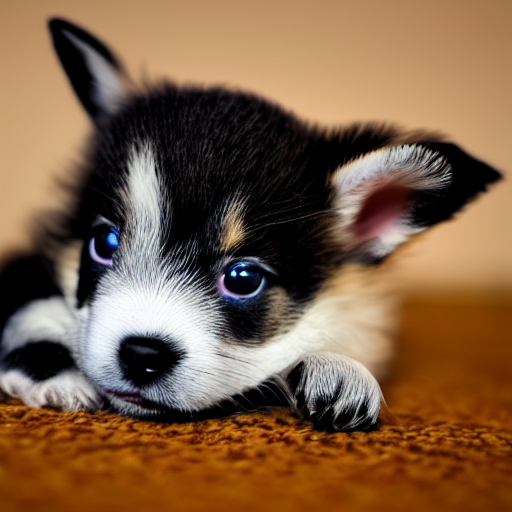

In [44]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_embedding_layer(input_ids)

puppy_token_embedding = token_embedding_layer(torch.tensor(6829, device = torch_device))
skunk_token_embedding = token_embedding_layer(torch.tensor(42194, device = torch_device))
replacement_token_embedding = 0.5* puppy_token_embedding + 0.5 * skunk_token_embedding

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

generate_with_embs(modified_output_embeddings)

#Time for some textual inversion
This is the idea of learning a new token embedding for a specific concept. So a few example images are used to create a new token embedding!

In [46]:
birb_embedding = torch.load('learned_embeds.bin')
birb_embedding.keys(), birb_embedding['<birb-style>'].shape

(dict_keys(['<birb-style>']), torch.Size([768]))

  0%|          | 0/30 [00:00<?, ?it/s]

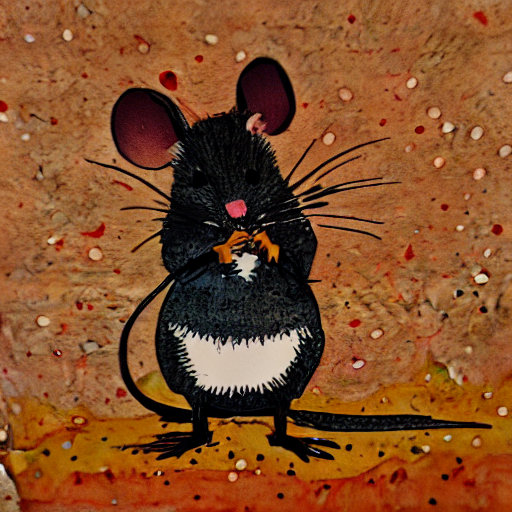

In [47]:
prompt = 'A mouse in the style of puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_embedding_layer(input_ids)

replacement_token_embedding = birb_embedding['<birb-style>'].to(torch_device)

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

generate_with_embs(modified_output_embeddings)

#Making a Chimera

  0%|          | 0/30 [00:00<?, ?it/s]

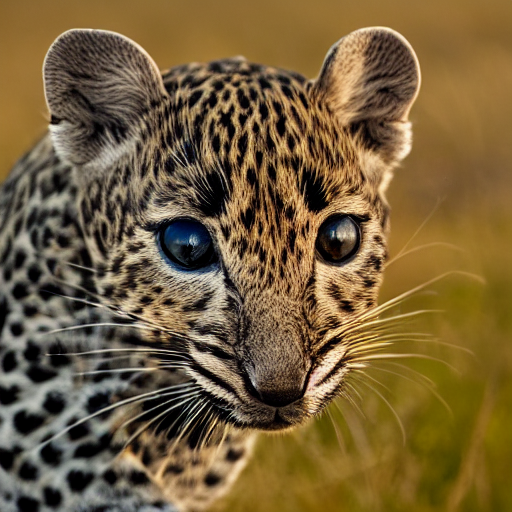

In [48]:
text_input1 = tokenizer("A mouse", padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input2 = tokenizer("A leopard", padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
  text_embeddings1 = text_encoder(text_input1.input_ids.to(torch_device))[0]
  text_embeddings2 = text_encoder(text_input2.input_ids.to(torch_device))[0]

mix_factor = .35
mixed_embeddings = text_embeddings1 * mix_factor + \
                   text_embeddings2 * (1-mix_factor)
generate_with_embs(mixed_embeddings)

# UNET and Classifier Free Guidance..
We've kinda just been trusting the process. But the actual diffusion model uses the Unet which:



1.   Takes in noisy latents
2.   predicts the noise

this is done with a conditional model that also takes in the timestep and our text embedding (the encoder_hidden_states).

This essentially makes the equation
noise_pred = unet(latents, t, encoder_hidden_states = text_embeddings)["sample"]



In [64]:
prompt = "Oil painting of an otter in a top hat"
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Make a folder to store results
!rm -rf steps/
!mkdir -p steps/

scheduler.set_timesteps(30)

t = scheduler.timesteps[0]
sigma = scheduler.sigmas[0]

latents = torch.randn((batch_size, unet.config.in_channels, height//8, width//8),
                      generator = generator,
                      )

latents = latents.to(torch_device)

latents = latents * scheduler.init_noise_sigma

text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]

uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)

with torch.no_grad():
  uncon_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

text_embeddings = torch.cat([uncon_embeddings, text_embeddings])

# with torch.no_grad():
#   noise_pred = unet(latents, t, encoder_hidden_states = text_embeddings)['sample']

# print(latents.shape, noise_pred.shape)

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # Get the predicted x0:
    # latents_x0 = latents - sigma * noise_pred # Calculating ourselves
    scheduler_step = scheduler.step(noise_pred, t, latents) #goes from current latent to slightly less noisy latents.
    latents_x0 = scheduler_step.pred_original_sample # Using the scheduler (Diffusers 0.4 and above)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler_step.prev_sample

    # To PIL Images
    im_t0 = latent_to_pil(latents_x0)[0]
    im_next = latent_to_pil(latents)[0]

    # Combine the two images and save for later viewing
    im = Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))
    im.paste(im_t0, (512, 0))
    im.save(f'steps/{i:04}.jpeg')

  0%|          | 0/30 [00:00<?, ?it/s]

In [63]:
# Make and show the progress video (change width to 1024 for full res)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#Next steps for me
sooo I want to make an interpolation project. It seems like everyhting here is already good to go.

I need:


1.   Latents of first image
2.   Latents of second image

And I need to use an alpha to move from the latents of the first image to the second image.


I'm gonna try interpolating between siddarth.jpg and bud.jpg



In [9]:
siddarth_img = Image.open('siddarth.jpg').resize((512,512))

In [15]:
encoded_sid = pil_to_latent(siddarth_img)

In [16]:
def show_latent_components(encoded_img):
  fig, axs = plt.subplots(1,4, figsize = (16,4))
  for c in range(len(encoded_img[0])):
    axs[c].imshow(encoded_img[0][c].cpu(), cmap = 'Greys')

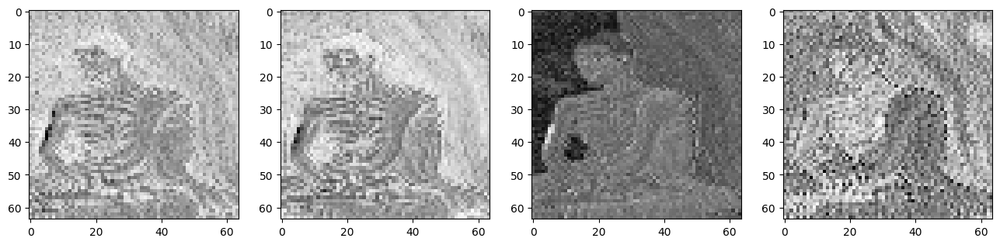

In [17]:
show_latent_components(encoded_sid)

In [25]:
bud_img = Image.open('kitty.jpg').resize((512,512))

In [26]:
encoded_bud = pil_to_latent(bud_img)

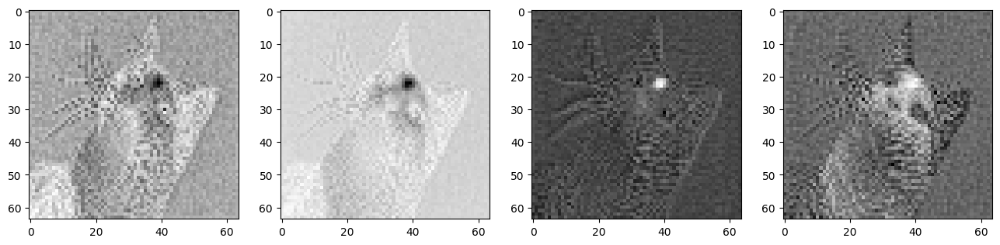

In [27]:
show_latent_components(encoded_bud)

In [97]:
!rm -rf linear_steps/
!mkdir -p linear_steps/

In [125]:
def linear_interpolate(steps_desired):
  for i, alpha in enumerate(numpy.linspace(0,1,steps_desired)):
    new_encoding = ((1-alpha)*encoded_bud) + (alpha * encoded_sid)
    im = latent_to_pil(new_encoding)[0]
    im.save(f'linear_steps/{i:04}.jpeg')

In [126]:
linear_interpolate(100)

In [127]:
!rm -rf cos_steps/
!mkdir -p cos_steps/

In [129]:
import numpy as np

def cosine_interpolation(a, b, alpha):

  theta = alpha * np.pi

  smoothed_alpha = (1 - np.cos(theta)) / 2
  # Perform linear interpolation with the smoothed alpha
  interpolated_value = (1 - smoothed_alpha) * a + smoothed_alpha * b
  return interpolated_value

In [128]:
import numpy as np

def cosine_interpolate(steps_desired):
  # Iterate directly over the alpha values generated by linspace, and get an index i
  for i, alpha in enumerate(numpy.linspace(0,1,steps_desired)):
    # Use the cosine_interpolation helper function
    new_encoding = cosine_interpolation(encoded_bud, encoded_sid, alpha)
    im = latent_to_pil(new_encoding)[0] # Assuming latent_to_pil returns a list, get the first image
    im.save(f'cos_steps/{i:04}.jpeg') # Use the index 'i' for the filename

In [133]:
cosine_interpolate(100)

In [131]:
!ffmpeg -v 1 -y -f image2 -framerate 12 -i linear_steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p linear_out.mp4
mp4 = open('linear_out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
from IPython.display import HTML
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [134]:
# Make and show the progress video for cosine steps
!ffmpeg -v 1 -y -f image2 -framerate 12 -i cos_steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p cos_out.mp4
mp4 = open('cos_out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
from IPython.display import HTML
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [5]:
import math

In [21]:
!rm -rf slerp_steps/
!mkdir -p slerp_steps/

In [6]:
def lerp(a, b, t):
    return (1 - t) * a + t * b

In [7]:
def slerp(a: torch.Tensor, b: torch.Tensor, t: float):
    # assume a,b have same norm (or normalize them)
    dot = (a * b).sum() / (a.norm() * b.norm())
    ω   = torch.acos(dot.clamp(-1,1))
    so  = torch.sin(ω)
    if so < 1e-6:
        return lerp(a, b, t)   # fall back to linear if angle ~0
    return (torch.sin((1 - t)*ω)/so)*a + (torch.sin(t*ω)/so)*b


In [23]:
def smooth_slerp(a, b, α):
    s = α*α*(3 - 2*α)
    return latent_to_pil(slerp(a, b, s))[0]

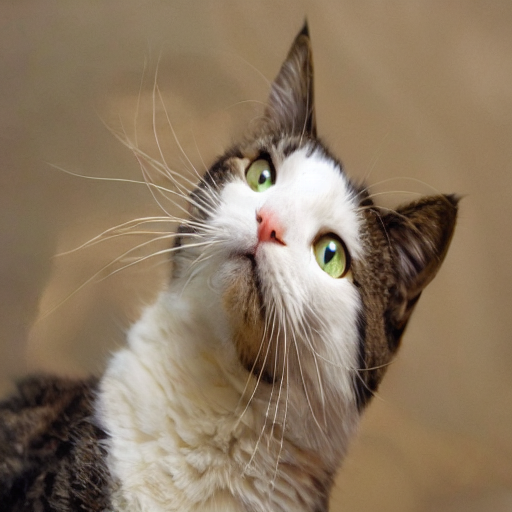

In [31]:
smooth_slerp(encoded_bud,encoded_sid, 0.2)

In [32]:
!rm -rf slerp_steps/
!mkdir -p slerp_steps/

In [35]:
def smooth_slerp_interpolate(steps_desired):
  # Iterate directly over the alpha values generated by linspace, and get an index i
  for i, alpha in enumerate(numpy.linspace(0,1,steps_desired)):
    # Use the smooth_slerp function
    im = smooth_slerp(encoded_bud, encoded_sid, alpha)
    im.save(f'slerp_steps/{i:04}.jpeg') # Use the index 'i' for the filename

In [36]:
smooth_slerp_interpolate(50)

In [38]:
# Make and show the progress video for cosine steps
!ffmpeg -v 1 -y -f image2 -framerate 12 -i slerp_steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p slerp_out.mp4
mp4 = open('slerp_out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
from IPython.display import HTML
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)